# CloudSurvey — T-P Profiles and Condensate Onsets

**Figure 1** — T-P profiles for each composition (one panel), colour-coded by equilibrium temperature.  
Failing grid points are highlighted by a semi-transparent red halo along the affected portion of the curve.

**Figure 2** — Same profiles with condensate *cloud-base* markers (▼) overlaid.  
A condensate is labelled at the highest-P grid point where it first appears going upward (the cloud base), provided:
- its number density / total condensate number density > `COND_FRAC_THRESH` (1 × 10⁻⁶), **and**
- its number density / gas number density > `COND_GAS_THRESH` (1 × 10⁻¹⁰).

Condensates whose cloud base coincides with the deepest grid point (i.e. present throughout the entire profile) are **excluded** from Figure 2 and shown separately in Figure 3.

**Figure 3** — Same T-P profiles. Condensates present at the deepest grid point are labelled with ▲ at their *cloud top* — the lowest-P grid point where they are still non-negligible (nd / n_gas > `COND_GAS_THRESH`).

Adjust the threshold constants in the **Configuration** cell to taste.

In [1]:
import sys
import warnings
from collections import defaultdict
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import cmasher as cmr

# monitor_utils lives in chemistry/ (or input/chemistry/ on the cluster)
_here = Path().resolve()
for _p in [_here / "chemistry", _here / "input" / "chemistry"]:
    if _p.is_dir() and (_p / "monitor_utils.py").exists():
        sys.path.insert(0, str(_p))
        break
from monitor_utils import parse_monitor

In [2]:
def formula_contains(formula, element):
    """Check if the formula contains a specific element."""
    idx = formula.find(element)
    while idx != -1:
        after = idx + len(element)
        if (after == len(formula)) or (not formula[after].islower()):
            return True
        idx = formula.find(element, idx + 1)
    return False


In [3]:
# ── Grid parameters (must match grid_retry.py / grid_best.py) ────────────────
OUTPUT_ROOT  = Path("output/grid_day")
TEMPERATURES = list(range(200, 1800, 200))    # 200, 400, …, 1600 K
COMPOSITIONS = ["Bath(H4)", "EH3", "EL3", "Krymka(LL3)", "R3", "asplund_m3"]

K_B_CGS = 1.380649e-16   # erg K⁻¹

# ── Condensate thresholds ─────────────────────────────────────────────────────
COND_FRAC_THRESH = 1e-6    # condensate nd / total condensate nd  (cloud-base test)
COND_GAS_THRESH  = 1e-10   # condensate nd / gas nd               (both tests)

# ── Colour scheme: ember, cold (200 K) → hot (1600 K) ───────────────────────
CMAP = cmr.ember
NORM = mcolors.Normalize(vmin=200, vmax=1600)

In [4]:
# ── Helper: chemistry directory for one profile ───────────────────────────────
def chem_dir(comp, T_eq):
    return OUTPUT_ROOT / f"{T_eq}K_{comp}_day" / "chemistry"


# ── Load T, P, failure mask from monitor_best.dat ────────────────────────────
def load_tp_monitor(comp, T_eq):
    """Return (T_arr, P_arr, fail_mask) or (None, None, None) if missing.

    fail_mask[i] is True where grid point i has ANY convergence or
    element-conservation failure.
    """
    path = chem_dir(comp, T_eq) / "monitor_best.dat"
    if not path.exists():
        return None, None, None

    df = parse_monitor(path)
    T  = df["T_K"].values
    P  = df["p_bar"].values

    fail = pd.Series(False, index=df.index)
    if "converged"      in df.columns: fail |= ~df["converged"].astype(bool)
    if "elem_conserved" in df.columns: fail |= ~df["elem_conserved"].astype(bool)

    return T, P, fail.values


# ── Load condensate number densities from condensates_best.dat ───────────────
def load_condensate_data(comp, T_eq):
    """Return (T_arr, P_arr, n_gas, cond_df) or (None,)*4 if missing.

    cond_df : DataFrame, one column per condensate species (cm⁻³).
    n_gas   : ideal-gas number density computed from P, T (cm⁻³).
    """
    path = chem_dir(comp, T_eq) / "condensates_best.dat"
    if not path.exists():
        return None, None, None, None

    df = pd.read_csv(path, sep="\t")
    df.columns = [c.strip().lstrip("#") for c in df.columns]

    # Condensate species names contain ( or [ (e.g. "MgSiO3(s,l)", "Fe[s]").
    # Element-condensation-degree columns are plain element symbols.
    skip = {"grid_point", "p(bar)", "T(K)"}
    remaining = [c for c in df.columns if c not in skip]
    cond_cols = [c for c in remaining if "(" in c or "[" in c]

    P     = df["p(bar)"].values
    T     = df["T(K)"].values
    n_gas = P * 1e6 / (K_B_CGS * T)

    return T, P, n_gas, df[cond_cols]


# ── Classify condensate onsets ────────────────────────────────────────────────
def classify_condensate_onsets(T, P, n_gas, cond_df):
    """Split condensates into those with an interior cloud base vs those present
    throughout the entire pressure range.

    Returns
    -------
    interior : dict  species → (T_onset, P_onset)
        Condensates whose cloud base (highest P where both thresholds hold) is
        strictly inside the profile — i.e. onset_P < max(P).

    deep : dict  species → (T_top, P_top)
        Condensates present at the deepest grid point.  Keyed to their *cloud
        top*: the lowest P where nd / n_gas > COND_GAS_THRESH.
    """
    P_max      = P.max()
    nd_all     = cond_df.values                  # (n_grid, n_species)
    total_cond = nd_all.sum(axis=1)              # (n_grid,)

    interior = {}
    deep     = {}

    for j, col in enumerate(cond_df.columns):
        nd = nd_all[:, j]
        with np.errstate(divide="ignore", invalid="ignore"):
            frac      = np.where(total_cond > 0, nd / total_cond, 0.0)
            gas_ratio = nd / n_gas

        # Cloud-base mask: both thresholds
        base_mask = (frac > COND_FRAC_THRESH) & (gas_ratio > COND_GAS_THRESH)
        if not base_mask.any():
            continue

        onset_P = P[base_mask].max()
        onset_T = T[base_mask][np.argmax(P[base_mask])]

        if onset_P == P_max:
            # Present at the deepest point — find cloud top instead
            # Cloud-top mask: gas-ratio threshold only (fraction can be misleading
            # at the top of the cloud where total condensate is vanishing)
            top_mask = gas_ratio > COND_GAS_THRESH
            if top_mask.any():
                top_T = T[top_mask][np.argmin(P[top_mask])]
                top_P = P[top_mask].min()
                deep[col] = (top_T, top_P)
        else:
            interior[col] = (onset_T, onset_P)

    return interior, deep


# ── Precompute onsets for all profiles ────────────────────────────────────────
# Stored as ALL_DATA[(comp, T_eq)] = (T_arr, P_arr, fail, interior, deep)
# where interior/deep are the dicts from classify_condensate_onsets.
ALL_DATA = {}
n_found  = 0

for comp in COMPOSITIONS:
    for T_eq in TEMPERATURES:
        T_arr, P_arr, fail = load_tp_monitor(comp, T_eq)
        if T_arr is None:
            continue
        n_found += 1

        T_c, P_c, n_gas, cond_df = load_condensate_data(comp, T_eq)
        if T_c is not None:
            interior, deep = classify_condensate_onsets(T_c, P_c, n_gas, cond_df)
        else:
            interior, deep = {}, {}

        ALL_DATA[(comp, T_eq)] = (T_arr, P_arr, fail, interior, deep)

total = len(COMPOSITIONS) * len(TEMPERATURES)
print(f"{n_found}/{total} profiles loaded.")

48/48 profiles loaded.


## Figure 1 — T-P Profiles

Failing grid points are highlighted by a wide semi-transparent red halo drawn beneath the curve.

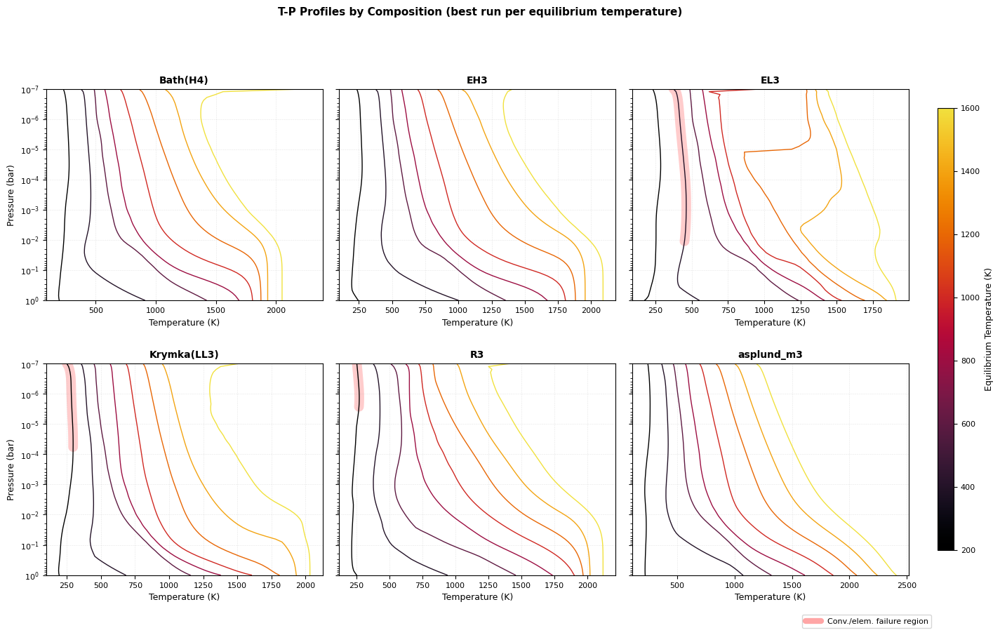

Saved tp_profiles.pdf


In [5]:
NC   = len(COMPOSITIONS)
ncol = min(3, NC)
nrow = int(np.ceil(NC / ncol))

fig1, axes1 = plt.subplots(nrow, ncol, figsize=(5.5 * ncol, 4.5 * nrow), sharey=True)
fig1.subplots_adjust(right=0.87, wspace=0.06, hspace=0.30)
axes1_flat = axes1.ravel() if NC > 1 else [axes1]

for extra in axes1_flat[NC:]:
    extra.set_visible(False)

for ax, comp in zip(axes1_flat, COMPOSITIONS):
    ax.set_title(comp, fontsize=10, fontweight="bold")
    ax.set_xlabel("Temperature (K)", fontsize=9)

    for T_eq in TEMPERATURES:
        entry = ALL_DATA.get((comp, T_eq))
        if entry is None:
            continue
        T_arr, P_arr, fail, *_ = entry
        color = CMAP(NORM(T_eq))

        # ── Failure shading: wide semi-transparent halo beneath the curve ──
        if fail.any():
            T_halo = T_arr.astype(float).copy()
            P_halo = P_arr.astype(float).copy()
            T_halo[~fail] = np.nan
            P_halo[~fail] = np.nan
            ax.plot(
                T_halo, P_halo,
                color="red", linewidth=10, alpha=0.20,
                solid_capstyle="round", solid_joinstyle="round",
                zorder=1,
            )

        # ── T-P curve on top ───────────────────────────────────────────────
        ax.plot(T_arr, P_arr, color=color, linewidth=1.0, zorder=2)

    ax.set_yscale("log")
    ax.set_ylim(1e0, 1e-7)
    ax.tick_params(axis="both", labelsize=8)
    ax.grid(True, which="major", ls=":", lw=0.4, alpha=0.6)

# y-label on leftmost column only
for r in range(nrow):
    axes1_flat[r * ncol].set_ylabel("Pressure (bar)", fontsize=9)

# Shared colorbar
sm1 = plt.cm.ScalarMappable(cmap=CMAP, norm=NORM)
sm1.set_array([])
cbar_ax1 = fig1.add_axes([0.895, 0.15, 0.014, 0.70])
cb1 = fig1.colorbar(sm1, cax=cbar_ax1)
cb1.set_label("Equilibrium Temperature (K)", fontsize=9)
cb1.set_ticks(TEMPERATURES)
cb1.ax.tick_params(labelsize=8)

# Failure legend
fail_proxy1 = Line2D(
    [], [], color="red", linewidth=6, alpha=0.35,
    solid_capstyle="round", label="Conv./elem. failure region",
)
fig1.legend(
    handles=[fail_proxy1], loc="lower right",
    bbox_to_anchor=(0.893, 0.02), fontsize=8, framealpha=0.8,
)

fig1.suptitle(
    "T-P Profiles by Composition (best run per equilibrium temperature)",
    fontsize=11, fontweight="bold", y=1.01,
)

fig1.savefig("tp_profiles.pdf", bbox_inches="tight", dpi=150)
plt.show()
print("Saved tp_profiles.pdf")

## Figure 2 — Interior Condensate Cloud Bases

Downward triangles (▼) mark the cloud base of each condensate whose onset lies **within** the calculated pressure range.  
Condensates present at the deepest grid point are omitted here and appear in Figure 3.

> **Note on crowding:** multiple condensates can share the same cloud-base grid point.  
> Labels are stacked vertically in offset-point space to reduce overlap, but some crowding is expected.

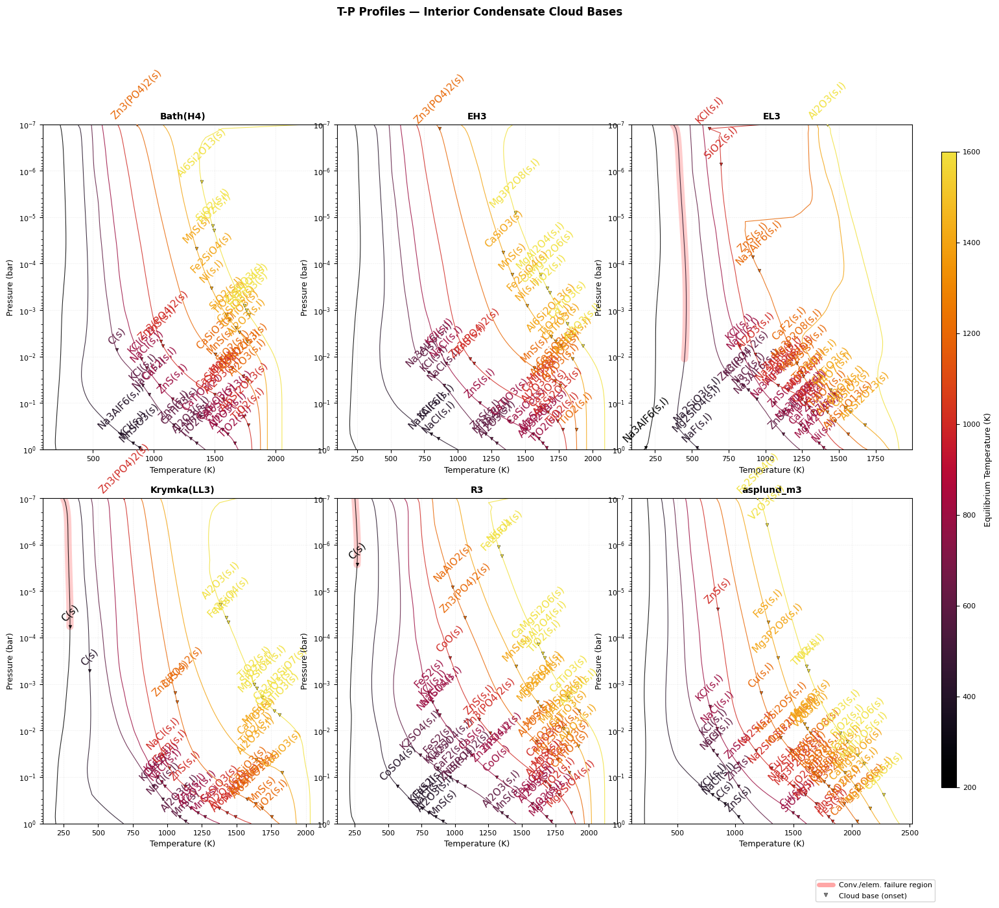

Saved tp_condensate_onsets.pdf


In [6]:
NROWS2, NCOLS2 = nrow, ncol
fig2, axes2 = plt.subplots(NROWS2, NCOLS2, figsize=(6 * NCOLS2, 7 * NROWS2))
fig2.subplots_adjust(right=0.87, hspace=0.15, wspace=0.05)
axes2_flat = axes2.ravel() if NC > 1 else [axes2]

for extra in axes2_flat[NC:]:
    extra.set_visible(False)

for ax, comp in zip(axes2_flat, COMPOSITIONS):
    ax.set_title(comp, fontsize=10, fontweight="bold")
    ax.set_xlabel("Temperature (K)", fontsize=9)
    ax.set_ylabel("Pressure (bar)", fontsize=9)
    ax.set_yscale("log")
    ax.set_ylim(1e0, 1e-7)
    ax.tick_params(axis="both", labelsize=8)
    ax.grid(True, which="major", ls=":", lw=0.4, alpha=0.5)

    for T_eq in TEMPERATURES:
        entry = ALL_DATA.get((comp, T_eq))
        if entry is None:
            continue
        T_arr, P_arr, fail, interior, _deep = entry
        color = CMAP(NORM(T_eq))

        # Failure halo + T-P curve
        if fail.any():
            T_halo = T_arr.astype(float).copy()
            P_halo = P_arr.astype(float).copy()
            T_halo[~fail] = np.nan
            P_halo[~fail] = np.nan
            ax.plot(T_halo, P_halo, color="red", linewidth=8, alpha=0.20,
                    solid_capstyle="round", solid_joinstyle="round", zorder=1)
        ax.plot(T_arr, P_arr, color=color, linewidth=0.8, alpha=0.85, zorder=2)

        # ── Interior cloud bases only ─────────────────────────────────────
        if not interior:
            continue

        # Group co-located onsets so we can stagger their labels
        point_groups = defaultdict(list)
        for species, (T_on, P_on) in sorted(interior.items(), key=lambda kv: kv[1][0]):
            point_groups[(T_on, P_on)].append(species)

        for (T_on, P_on), species_list in sorted(point_groups.items()):
            ax.plot(
                T_on, P_on, marker="v",
                color=color, markersize=3.5,
                markeredgewidth=0.3, markeredgecolor="k",
                linestyle="none", zorder=6,
            )
            for k, species in enumerate(species_list):
                ax.annotate(
                    species.strip(),
                    xy=(T_on, P_on),
                    xytext=(0, 4 + k * 11),
                    textcoords="offset points",
                    fontsize=11, color=color,
                    rotation=45, ha="center", va="bottom",
                    zorder=7,
                )

# Shared colorbar
sm2 = plt.cm.ScalarMappable(cmap=CMAP, norm=NORM)
sm2.set_array([])
cbar_ax2 = fig2.add_axes([0.895, 0.15, 0.013, 0.70])
cb2 = fig2.colorbar(sm2, cax=cbar_ax2)
cb2.set_label("Equilibrium Temperature (K)", fontsize=9)
cb2.set_ticks(TEMPERATURES)
cb2.ax.tick_params(labelsize=8)

fail_proxy2 = Line2D([], [], color="red", linewidth=5, alpha=0.35,
                     solid_capstyle="round", label="Conv./elem. failure region")
onset_proxy2 = Line2D([], [], marker="v", color="grey", linestyle="none",
                      markersize=4, markeredgewidth=0.3, markeredgecolor="k",
                      label="Cloud base (onset)")
fig2.legend(
    handles=[fail_proxy2, onset_proxy2],
    loc="lower right", bbox_to_anchor=(0.893, 0.02),
    fontsize=8, framealpha=0.8,
)

fig2.suptitle(
    "T-P Profiles — Interior Condensate Cloud Bases",
    fontsize=12, fontweight="bold", y=1.01,
)

fig2.savefig("tp_condensate_onsets.pdf", bbox_inches="tight", dpi=150)
plt.show()
print("Saved tp_condensate_onsets.pdf")

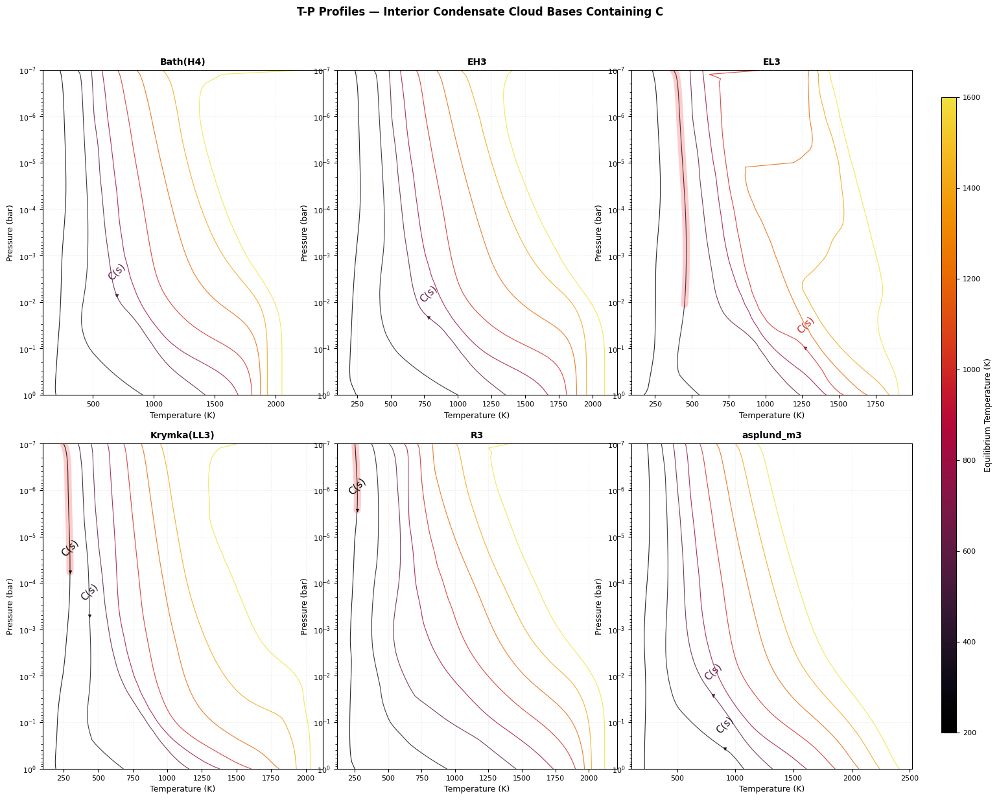

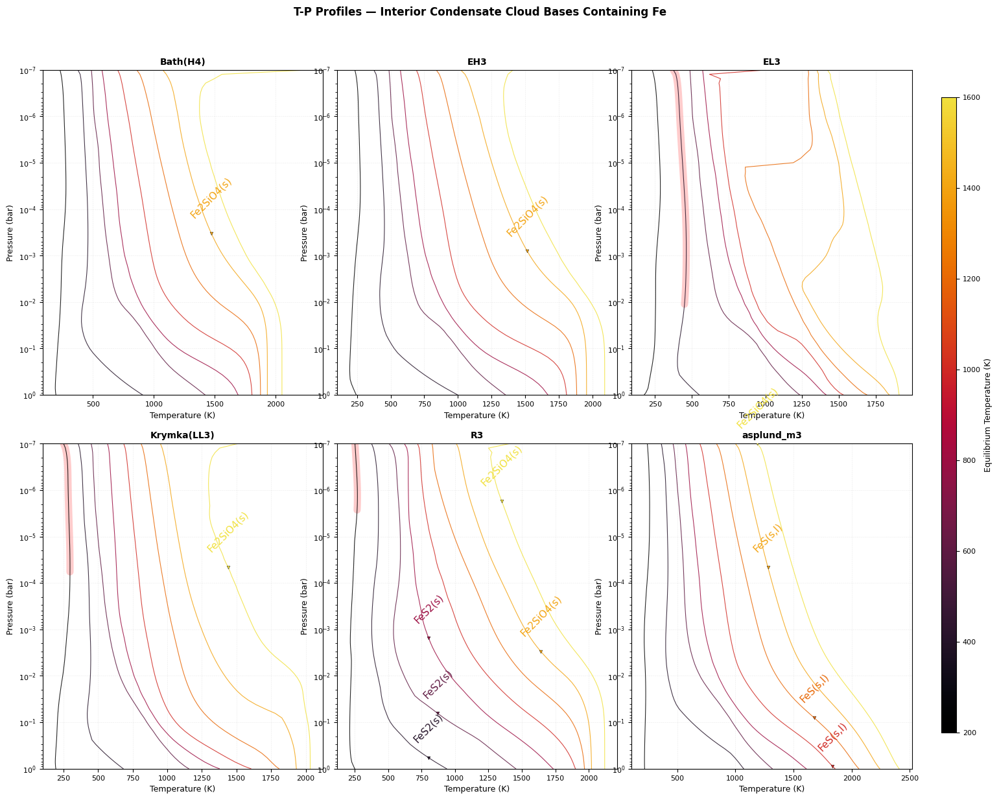

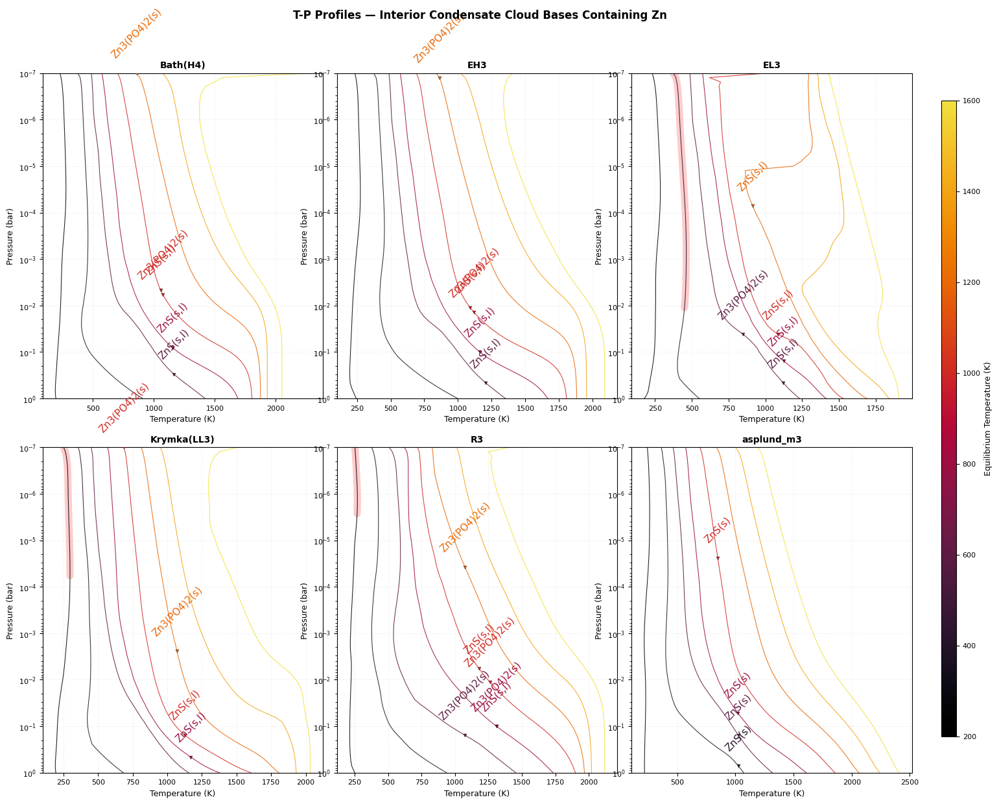

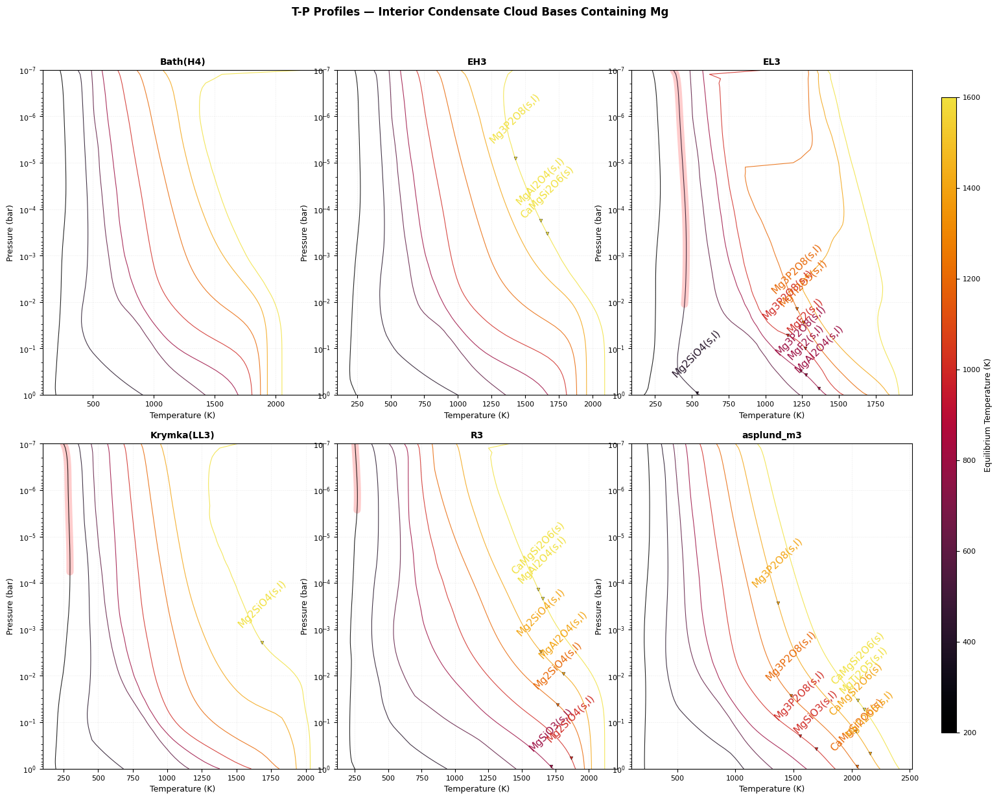

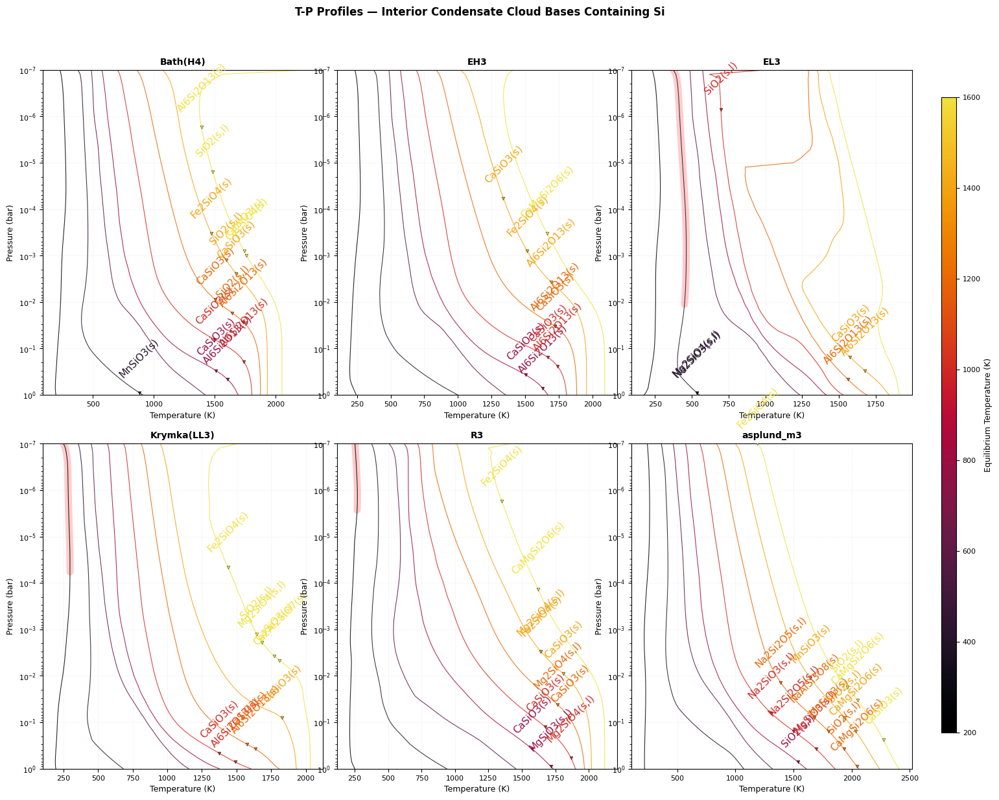

...

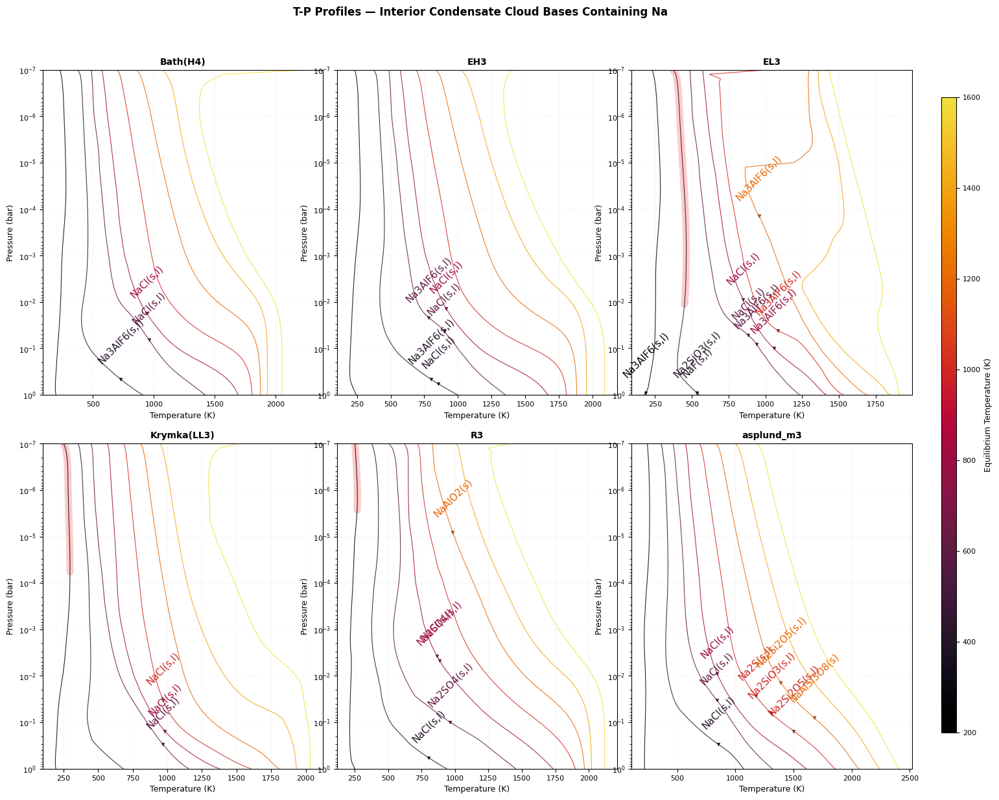

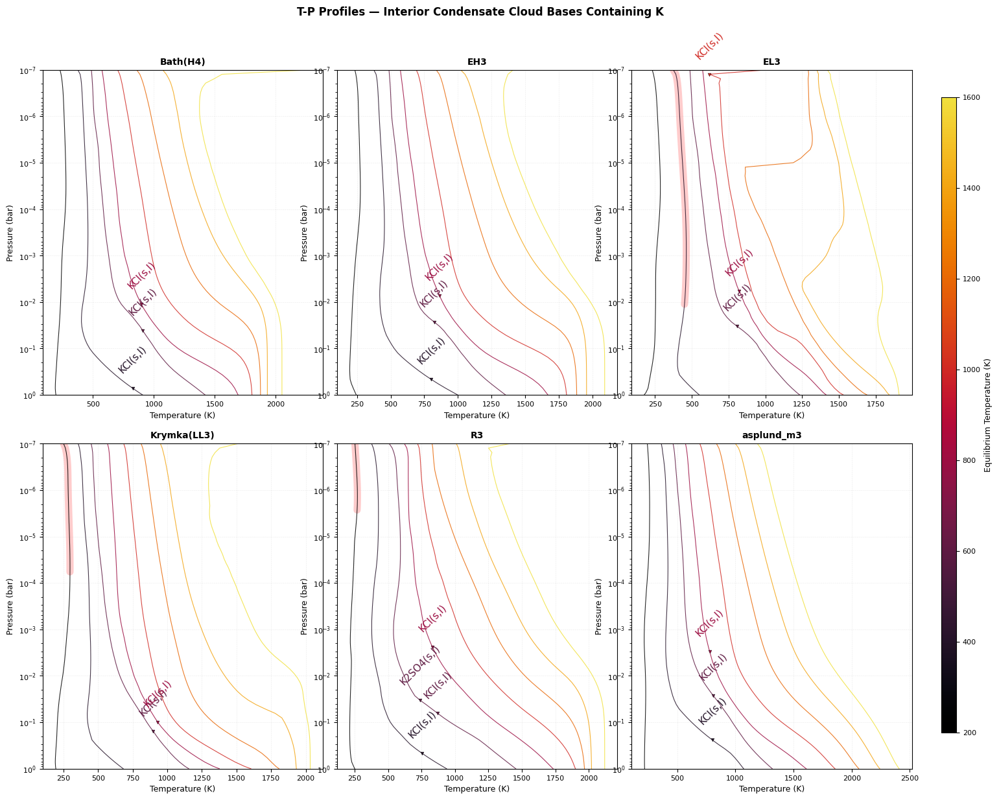

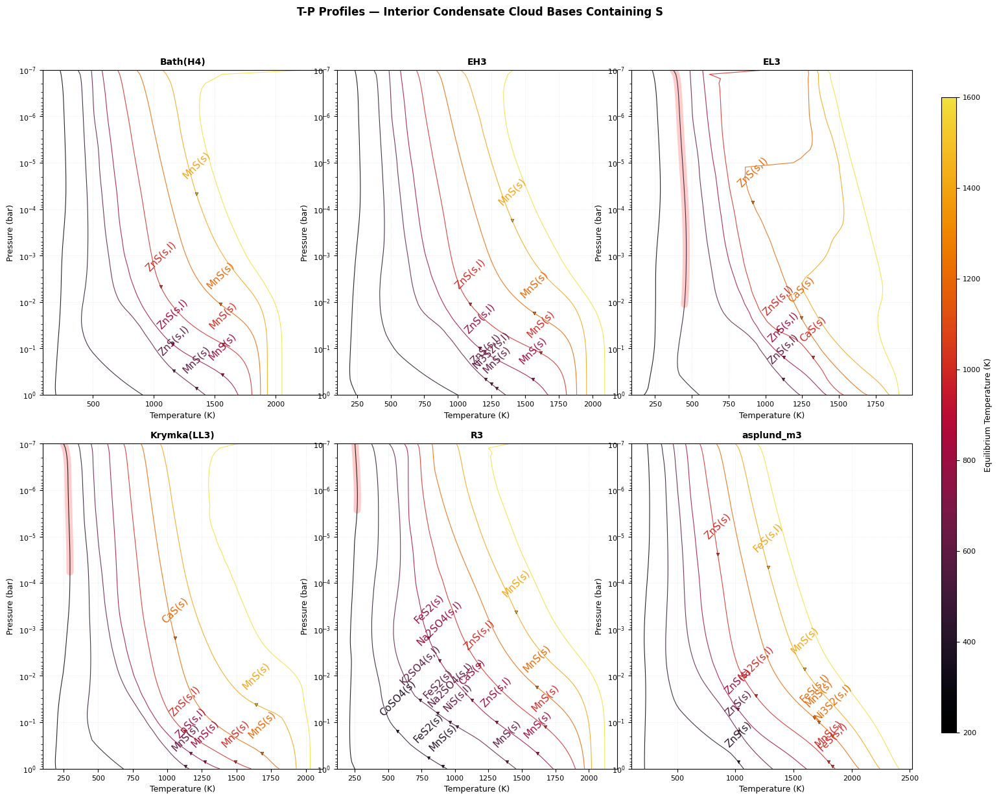

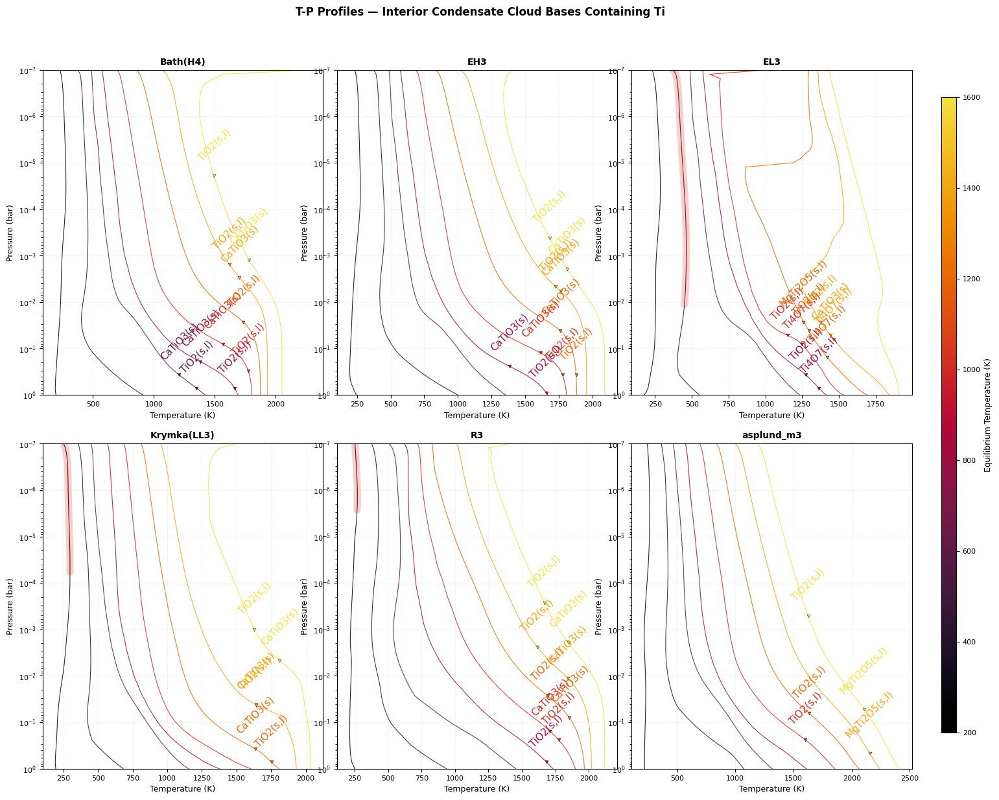

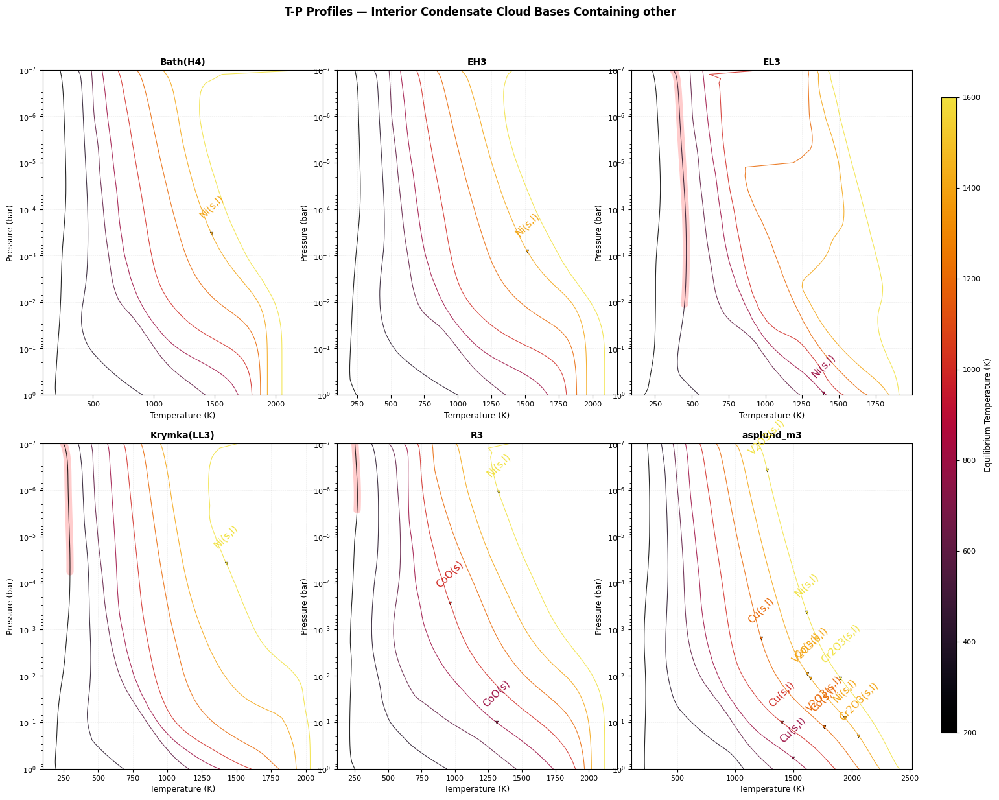

In [7]:
elements_isolate = ["C", "Fe", "Zn", "Mg", "Si", "Ca", "Al", "Na", "K", "S", "Ti", "other"]

for el in elements_isolate:

    NROWS2, NCOLS2 = nrow, ncol
    fig2, axes2 = plt.subplots(NROWS2, NCOLS2, figsize=(6 * NCOLS2, 7 * NROWS2))
    fig2.subplots_adjust(right=0.87, hspace=0.15, wspace=0.05)
    axes2_flat = axes2.ravel() if NC > 1 else [axes2]

    for extra in axes2_flat[NC:]:
        extra.set_visible(False)

    for ax, comp in zip(axes2_flat, COMPOSITIONS):
        ax.set_title(comp, fontsize=10, fontweight="bold")
        ax.set_xlabel("Temperature (K)", fontsize=9)
        ax.set_ylabel("Pressure (bar)", fontsize=9)
        ax.set_yscale("log")
        ax.set_ylim(1e0, 1e-7)
        ax.tick_params(axis="both", labelsize=8)
        ax.grid(True, which="major", ls=":", lw=0.4, alpha=0.5)

        for T_eq in TEMPERATURES:
            entry = ALL_DATA.get((comp, T_eq))
            if entry is None:
                continue
            T_arr, P_arr, fail, interior, _deep = entry
            color = CMAP(NORM(T_eq))

            # Failure halo + T-P curve
            if fail.any():
                T_halo = T_arr.astype(float).copy()
                P_halo = P_arr.astype(float).copy()
                T_halo[~fail] = np.nan
                P_halo[~fail] = np.nan
                ax.plot(T_halo, P_halo, color="red", linewidth=8, alpha=0.20,
                        solid_capstyle="round", solid_joinstyle="round", zorder=1)
            ax.plot(T_arr, P_arr, color=color, linewidth=0.8, alpha=0.85, zorder=2)

            # ── Interior cloud bases only ─────────────────────────────────────
            if not interior:
                continue

            # Group co-located onsets so we can stagger their labels
            for species in interior.keys():
                if el == "other":
                    if any(formula_contains(species, e) for e in elements_isolate if e != "other"):
                        continue
                elif not formula_contains(species, el):
                    continue
                (T_on, P_on) = interior[species]
                ax.plot(
                    T_on, P_on, marker="v",
                    color=color, markersize=3.5,
                    markeredgewidth=0.3, markeredgecolor="k",
                    linestyle="none", zorder=6,
                )
                ax.annotate(
                    species.strip(),
                    xy=(T_on, P_on),
                    xytext=(0, 15),
                    textcoords="offset points",
                    fontsize=11, color=color,
                    rotation=45, ha="center", va="bottom",
                    zorder=7,
                )

    # Shared colorbar
    sm2 = plt.cm.ScalarMappable(cmap=CMAP, norm=NORM)
    sm2.set_array([])
    cbar_ax2 = fig2.add_axes([0.895, 0.15, 0.013, 0.70])
    cb2 = fig2.colorbar(sm2, cax=cbar_ax2)
    cb2.set_label("Equilibrium Temperature (K)", fontsize=9)
    cb2.set_ticks(TEMPERATURES)
    cb2.ax.tick_params(labelsize=8)

    fail_proxy2 = Line2D([], [], color="red", linewidth=5, alpha=0.35,
                        solid_capstyle="round", label="Conv./elem. failure region")
    onset_proxy2 = Line2D([], [], marker="v", color="grey", linestyle="none",
                        markersize=4, markeredgewidth=0.3, markeredgecolor="k",
                        label="Cloud base (onset)")

    fig2.suptitle(
        "T-P Profiles — Interior Condensate Cloud Bases Containing " + el,
        fontsize=12, fontweight="bold", y=0.95,
    )

## Figure 3 — Deep Condensates (present throughout the profile)

These condensates were already condensed at the deepest calculated grid point, so no cloud base is visible within the pressure range.  
Upward triangles (▲) mark their *cloud top* — the lowest-P grid point where nd / n_gas > `COND_GAS_THRESH` — i.e. the highest altitude at which each condensate is still present.

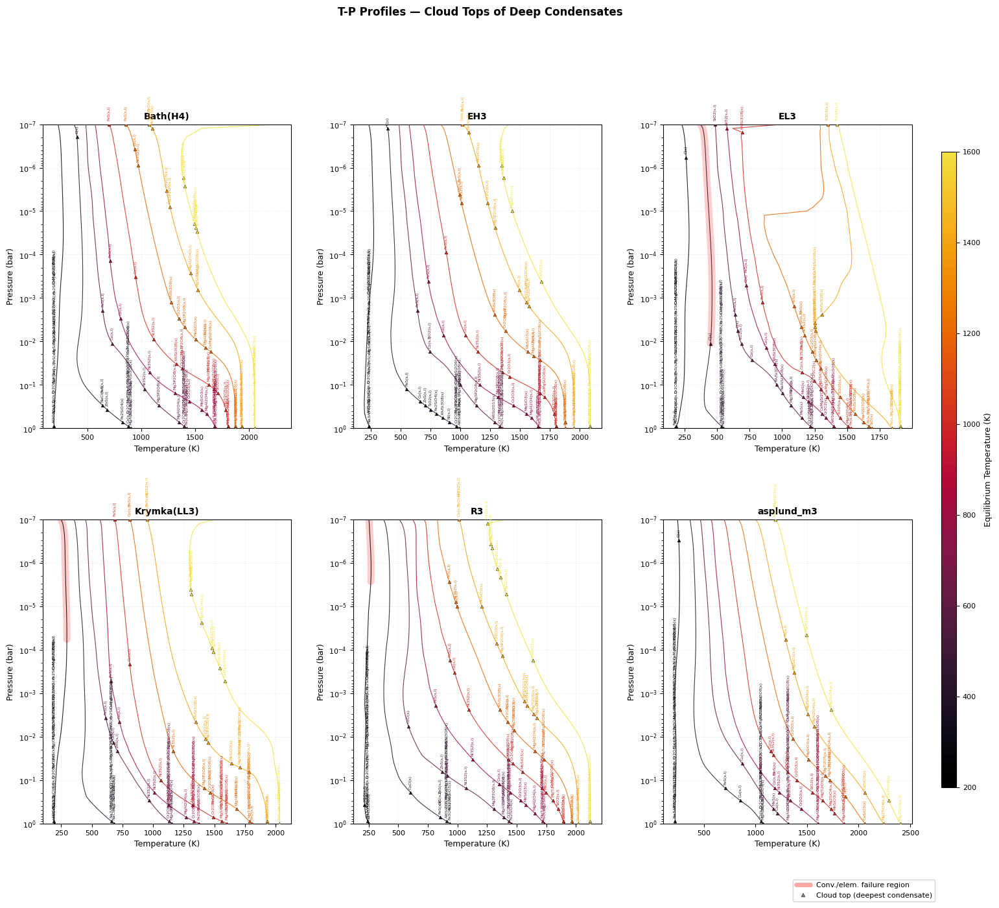

Saved tp_deep_condensates.pdf


In [8]:
NROWS3, NCOLS3 = nrow, ncol
fig3, axes3 = plt.subplots(NROWS3, NCOLS3, figsize=(6 * NCOLS3, 7 * NROWS3))
fig3.subplots_adjust(right=0.87, hspace=0.30, wspace=0.25)
axes3_flat = axes3.ravel() if NC > 1 else [axes3]

for extra in axes3_flat[NC:]:
    extra.set_visible(False)

for ax, comp in zip(axes3_flat, COMPOSITIONS):
    ax.set_title(comp, fontsize=10, fontweight="bold")
    ax.set_xlabel("Temperature (K)", fontsize=9)
    ax.set_ylabel("Pressure (bar)", fontsize=9)
    ax.set_yscale("log")
    ax.set_ylim(1e0, 1e-7)
    ax.tick_params(axis="both", labelsize=8)
    ax.grid(True, which="major", ls=":", lw=0.4, alpha=0.5)

    for T_eq in TEMPERATURES:
        entry = ALL_DATA.get((comp, T_eq))
        if entry is None:
            continue
        T_arr, P_arr, fail, _interior, deep = entry
        color = CMAP(NORM(T_eq))

        # Failure halo + T-P curve
        if fail.any():
            T_halo = T_arr.astype(float).copy()
            P_halo = P_arr.astype(float).copy()
            T_halo[~fail] = np.nan
            P_halo[~fail] = np.nan
            ax.plot(T_halo, P_halo, color="red", linewidth=8, alpha=0.20,
                    solid_capstyle="round", solid_joinstyle="round", zorder=1)
        ax.plot(T_arr, P_arr, color=color, linewidth=0.8, alpha=0.85, zorder=2)

        # ── Deep condensates: label at cloud top ──────────────────────────
        if not deep:
            continue

        # Group by cloud-top grid point to stagger co-located labels
        point_groups = defaultdict(list)
        for species, (T_top, P_top) in sorted(deep.items(), key=lambda kv: kv[1][0]):
            point_groups[(T_top, P_top)].append(species)

        for (T_top, P_top), species_list in sorted(point_groups.items()):
            ax.plot(
                T_top, P_top, marker="^",
                color=color, markersize=3.5,
                markeredgewidth=0.3, markeredgecolor="k",
                linestyle="none", zorder=6,
            )
            for k, species in enumerate(species_list):
                ax.annotate(
                    species.strip(),
                    xy=(T_top, P_top),
                    xytext=(0, 4 + k * 11),
                    textcoords="offset points",
                    fontsize=4.5, color=color,
                    rotation=90, ha="center", va="bottom",
                    zorder=7,
                )

# Shared colorbar
sm3 = plt.cm.ScalarMappable(cmap=CMAP, norm=NORM)
sm3.set_array([])
cbar_ax3 = fig3.add_axes([0.895, 0.15, 0.013, 0.70])
cb3 = fig3.colorbar(sm3, cax=cbar_ax3)
cb3.set_label("Equilibrium Temperature (K)", fontsize=9)
cb3.set_ticks(TEMPERATURES)
cb3.ax.tick_params(labelsize=8)

fail_proxy3 = Line2D([], [], color="red", linewidth=5, alpha=0.35,
                     solid_capstyle="round", label="Conv./elem. failure region")
top_proxy3 = Line2D([], [], marker="^", color="grey", linestyle="none",
                    markersize=4, markeredgewidth=0.3, markeredgecolor="k",
                    label="Cloud top (deepest condensate)")
fig3.legend(
    handles=[fail_proxy3, top_proxy3],
    loc="lower right", bbox_to_anchor=(0.893, 0.02),
    fontsize=8, framealpha=0.8,
)

fig3.suptitle(
    "T-P Profiles — Cloud Tops of Deep Condensates",
    fontsize=12, fontweight="bold", y=1.01,
)

fig3.savefig("tp_deep_condensates.pdf", bbox_inches="tight", dpi=150)
plt.show()
print("Saved tp_deep_condensates.pdf")

## Figure 4 — Dominant Interior Condensate Grid

For each (composition, T_eq) grid point, identify the single most abundant interior condensate at its cloud-base pressure.  
Columns reported:
- **Dominant Condensate** — species with the highest nd / total_cond_nd at its own onset pressure level
- **Cond. Frac.** — nd / total condensate nd at the onset pressure
- **Total Mat. Frac.** — nd / (n_gas + total_cond_nd) at the onset pressure
- **Onset T (K) / Onset P (bar)** — cloud-base location

In [9]:
# ── Build per-grid-point summary of dominant interior condensate ──────────────
# For each (comp, T_eq) we find the interior condensate whose fraction of total
# condensates (nd_j / total_cond) is highest *at its own cloud-base pressure*.

records = []

for comp in COMPOSITIONS:
    for T_eq in TEMPERATURES:
        entry = ALL_DATA.get((comp, T_eq))

        base_row = {"Composition": comp, "T_eq (K)": T_eq,
                    "Dominant Condensate": None,
                    "Cond. Frac.": None, "Total Mat. Frac.": None,
                    "Onset T (K)": None, "Onset P (bar)": None}

        if entry is None:
            records.append(base_row)
            continue

        _, _, _, interior, _ = entry
        if not interior:
            records.append(base_row)
            continue

        # Re-load condensate data to evaluate abundances at each onset point
        T_c, P_c, n_gas, cond_df = load_condensate_data(comp, T_eq)
        if T_c is None:
            records.append(base_row)
            continue

        nd_all     = cond_df.values                 # (n_grid, n_species)
        total_cond = nd_all.sum(axis=1)             # (n_grid,)

        col_list = list(cond_df.columns)

        best_species    = None
        best_cond_frac  = -1.0
        best_total_frac = None
        best_onset_T    = None
        best_onset_P    = None

        for species, (T_on, P_on) in interior.items():
            if species not in col_list:
                continue
            j   = col_list.index(species)
            idx = int(np.argmin(np.abs(P_c - P_on)))   # grid row at onset P

            nd = nd_all[idx, j]
            tc = total_cond[idx]
            ng = n_gas[idx]

            cond_frac  = float(nd / tc)           if tc > 0          else 0.0
            total_frac = float(nd / (ng + tc))    if (ng + tc) > 0   else 0.0

            if cond_frac > best_cond_frac:
                best_cond_frac  = cond_frac
                best_species    = species
                best_total_frac = total_frac
                best_onset_T    = T_on
                best_onset_P    = P_on

        records.append({
            "Composition":        comp,
            "T_eq (K)":          T_eq,
            "Dominant Condensate": best_species,
            "Cond. Frac.":        best_cond_frac  if best_species else None,
            "Total Mat. Frac.":   best_total_frac if best_species else None,
            "Onset T (K)":        best_onset_T,
            "Onset P (bar)":      best_onset_P,
        })

summary_df = pd.DataFrame(records)

# Pretty-print the table (non-null rows only)
display_df = (
    summary_df.dropna(subset=["Dominant Condensate"])
    .copy()
)
display_df["Cond. Frac."]      = display_df["Cond. Frac."].map("{:.3%}".format)
display_df["Total Mat. Frac."] = display_df["Total Mat. Frac."].map("{:.3e}".format)
display_df["Onset P (bar)"]    = display_df["Onset P (bar)"].map("{:.2e}".format)
display_df["Onset T (K)"]      = display_df["Onset T (K)"].map("{:.0f}".format)

pd.set_option("display.max_rows", 200)
pd.set_option("display.max_colwidth", 30)
print(f"\n{'='*90}")
print("Dominant Interior Condensate per Grid Point")
print(f"{'='*90}")
print(display_df.to_string(index=False))
print(f"{'='*90}\n")


Dominant Interior Condensate per Grid Point
Composition  T_eq (K) Dominant Condensate Cond. Frac. Total Mat. Frac. Onset T (K) Onset P (bar)
   Bath(H4)       400            KCl(s,l)     15.541%        5.576e-07         826      7.20e-01
   Bath(H4)       600                C(s)     99.995%        7.729e-03         694      7.20e-03
   Bath(H4)       800            ZnS(s,l)     99.816%        2.398e-04        1152      8.03e-02
   Bath(H4)      1000        Zn3(PO4)2(s)     99.955%        6.667e-05        1073      5.78e-03
   Bath(H4)      1200        Zn3(PO4)2(s)     99.999%        7.867e-05         858      1.00e-07
   Bath(H4)      1400          Al2O3(s,l)    100.000%        8.619e-07        1762      4.64e-03
   Bath(H4)      1600           CaTiO3(s)    100.000%        6.293e-08        1779      1.25e-03
        EH3       400            KCl(s,l)     52.254%        1.985e-06         802      4.64e-01
        EH3       600                C(s)     99.613%        8.589e-03         782

#dddddd
[0.83921569 0.15294118 0.15686275 1.        ]
[0.68235294 0.78039216 0.90980392 1.        ]
[0.7372549  0.74117647 0.13333333 1.        ]
[0.78039216 0.78039216 0.78039216 1.        ]
[0.78039216 0.78039216 0.78039216 1.        ]
[0.12156863 0.46666667 0.70588235 1.        ]
[1.         0.73333333 0.47058824 1.        ]
#dddddd
[0.83921569 0.15294118 0.15686275 1.        ]
[0.68235294 0.78039216 0.90980392 1.        ]
[0.7372549  0.74117647 0.13333333 1.        ]
[0.78039216 0.78039216 0.78039216 1.        ]
[0.49803922 0.49803922 0.49803922 1.        ]
[0.12156863 0.46666667 0.70588235 1.        ]
[0.12156863 0.46666667 0.70588235 1.        ]
[0.76862745 0.61176471 0.58039216 1.        ]
[1.         0.59607843 0.58823529 1.        ]
[0.7372549  0.74117647 0.13333333 1.        ]
[0.49803922 0.49803922 0.49803922 1.        ]
[0.83921569 0.15294118 0.15686275 1.        ]
[0.49803922 0.49803922 0.49803922 1.        ]
[0.49803922 0.49803922 0.49803922 1.        ]
[0.12156863 0.4666

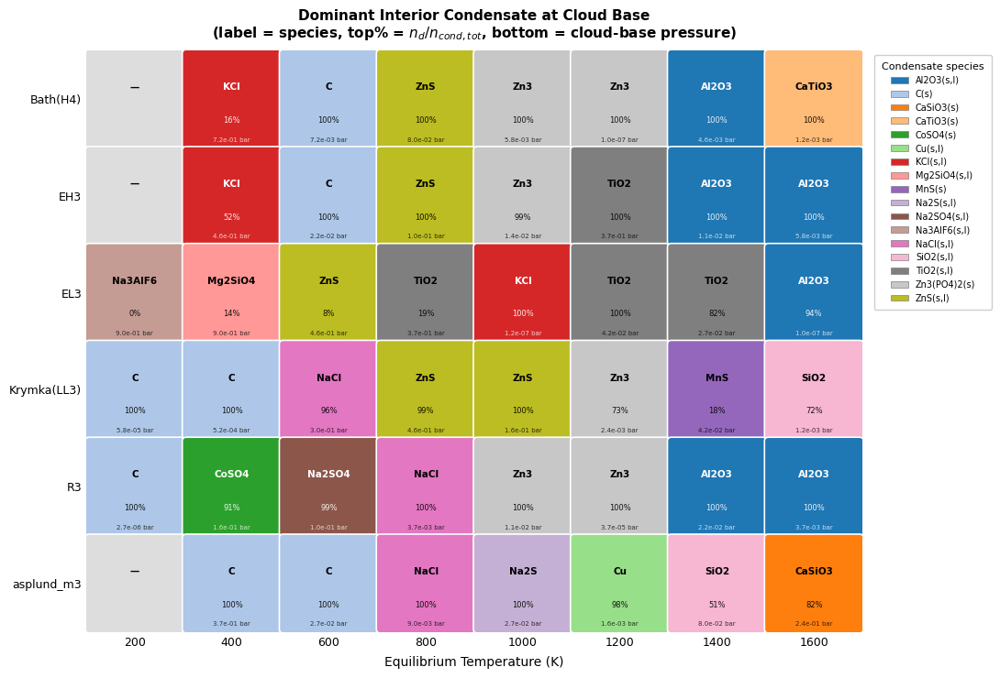

Saved dominant_condensate_grid.pdf


In [15]:
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker

# ── Assign a colour to every unique dominant-condensate species ───────────────
unique_species = sorted(
    summary_df["Dominant Condensate"].dropna().unique(),
    key=lambda s: s.strip(),
)
n_sp = len(unique_species)

# Use tab20 for up to 20 species, then cycle a broader palette
if n_sp <= 10:
    _base_colors = plt.cm.tab10(np.linspace(0, 1, 10, endpoint=False))
elif n_sp <= 20:
    _base_colors = plt.cm.tab20(np.linspace(0, 1, 20, endpoint=False))
else:
    _base_colors = plt.cm.hsv(np.linspace(0, 0.90, n_sp, endpoint=False))

species_color = {s: _base_colors[i % len(_base_colors)]
                 for i, s in enumerate(unique_species)}
species_idx   = {s: i for i, s in enumerate(unique_species)}

# ── Build 2-D grids indexed by [comp_row, temp_col] ──────────────────────────
comps = COMPOSITIONS
temps = TEMPERATURES
n_c, n_t = len(comps), len(temps)

grid_sp    = np.full((n_c, n_t), np.nan)   # species index (float for nan)
grid_cf    = np.full((n_c, n_t), np.nan)   # condensate fraction
grid_tf    = np.full((n_c, n_t), np.nan)   # total material fraction
grid_op    = np.full((n_c, n_t), np.nan)   # onset pressure (bar)

temp_idx = {t: i for i, t in enumerate(temps)}
comp_idx = {c: i for i, c in enumerate(comps)}

for _, row in summary_df.iterrows():
    sp = row["Dominant Condensate"]
    if pd.isna(sp):
        continue
    ci = comp_idx[row["Composition"]]
    ti = temp_idx[int(row["T_eq (K)"])]
    grid_sp[ci, ti] = species_idx[sp]
    grid_cf[ci, ti] = row["Cond. Frac."]
    grid_tf[ci, ti] = row["Total Mat. Frac."]
    grid_op[ci, ti] = row["Onset P (bar)"]

# ── Plot ──────────────────────────────────────────────────────────────────────
cell_w, cell_h = 1.55, 1.0          # inches per cell
fig_g, ax_g = plt.subplots(
    figsize=(cell_w * n_t + 3.5, cell_h * n_c + 1.5)
)
ax_g.set_aspect("equal")
ax_g.set_xlim(-0.5, n_t - 0.5)
ax_g.set_ylim(-0.5, n_c - 0.5)
ax_g.invert_yaxis()                 # comp[0] at top

for ci in range(n_c):
    for ti in range(n_t):
        sp_i = grid_sp[ci, ti]
        if np.isnan(sp_i):
            fc = "#dddddd"
            cell_text = "—"
            ann_cf, ann_p = "", ""
        else:
            sp = unique_species[int(sp_i)]
            fc = species_color[sp]
            # Strip phase suffix for a compact label: e.g. "MgSiO3(s,l)" → "MgSiO3"
            label_short = sp.strip().split("(")[0].split("[")[0]
            cell_text = label_short
            ann_cf = f"{grid_cf[ci, ti]:.0%}"
            ann_p  = f"{grid_op[ci, ti]:.1e} bar"

        rect = mpatches.FancyBboxPatch(
            (ti - 0.47, ci - 0.47), 0.94, 0.94,
            boxstyle="round,pad=0.04",
            facecolor=fc, edgecolor="white", linewidth=1.2,
            zorder=1,
        )
        ax_g.add_patch(rect)
        print(fc)
        # Decide text colour (dark on light background, white on dark)
        if len(fc)>2 and fc[0] != "#":
            lum = 0.299 * fc[0] + 0.587 * fc[1] + 0.114 * fc[2]
        else:
            lum = 1.0
        txt_col = "black" if lum > 0.45 else "white"

        ax_g.text(ti, ci - 0.12, cell_text,
                  ha="center", va="center", fontsize=7.5,
                  fontweight="bold", color=txt_col, zorder=2)
        if ann_cf:
            ax_g.text(ti, ci + 0.22, ann_cf,
                      ha="center", va="center", fontsize=6.0,
                      color=txt_col, alpha=0.90, zorder=2)
        if ann_p:
            ax_g.text(ti, ci + 0.42, ann_p,
                      ha="center", va="center", fontsize=5.0,
                      color=txt_col, alpha=0.75, zorder=2)

# ── Axes labels & ticks ───────────────────────────────────────────────────────
ax_g.set_xticks(range(n_t))
ax_g.set_xticklabels([str(t) for t in temps], fontsize=9)
ax_g.set_yticks(range(n_c))
ax_g.set_yticklabels(comps, fontsize=9)
ax_g.set_xlabel("Equilibrium Temperature (K)", fontsize=10, labelpad=6)
ax_g.set_title(
    "Dominant Interior Condensate at Cloud Base\n"
    r"(label = species, top% = $n_d/n_{cond,tot}$, bottom = cloud-base pressure)",
    fontsize=11, fontweight="bold", pad=10,
)

# Remove spines / ticks
for spine in ax_g.spines.values():
    spine.set_visible(False)
ax_g.tick_params(length=0)

# ── Legend ────────────────────────────────────────────────────────────────────
legend_handles = [
    mpatches.Patch(facecolor=species_color[s], label=s.strip(),
                   edgecolor="grey", linewidth=0.5)
    for s in unique_species
]
ax_g.legend(
    handles=legend_handles,
    title="Condensate species",
    title_fontsize=8,
    fontsize=7,
    loc="upper left",
    bbox_to_anchor=(1.01, 1.0),
    framealpha=0.95,
    borderpad=0.8,
)

plt.tight_layout()
fig_g.savefig("dominant_condensate_grid.pdf", bbox_inches="tight", dpi=150)
plt.show()
print("Saved dominant_condensate_grid.pdf")